# VAME 4-Keypoint Training Pipeline

Keypoints: `mouse_center`, `tail_base`, `head_midpoint`, `neck` (all >0.80 likelihood)

Correct VAME pipeline order:
1. Setup
2. Config
3. Preprocessing
4. Create trainset
5. Train model
6. Loss plots
7. Evaluate
8. Segment sessions
9. Community analysis
10. Motif videos
11. UMAP

In [27]:
# ── Cell 1: Setup ──────────────────────────────────────────────────────────────
import shutil, datetime, warnings
from pathlib import Path
import yaml

CONFIG_PATH = Path(r"C:\Users\zuria\Kaplan\Vame\Open-Field-Test\config.yaml")

def load_config():
    with open(CONFIG_PATH) as f:
        return yaml.safe_load(f)

def save_config(cfg):
    with open(CONFIG_PATH, "w") as f:
        yaml.dump(cfg, f, default_flow_style=False, allow_unicode=True)

def backup_config():
    ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    dst = CONFIG_PATH.with_name(f"config_backup_{ts}.yaml")
    shutil.copy(CONFIG_PATH, dst)
    print(f"Backup saved: {dst.name}")

backup_config()
cfg = load_config()
print("Config loaded.")

Backup saved: config_backup_20260405_160636.yaml
Config loaded.


In [28]:
# ── Cell 2: Update config ──────────────────────────────────────────────────────
# STOP any running training before re-running this cell.
#
# Keypoints: mouse_center, tail_base, head_midpoint, neck (all >0.80 likelihood)
# After egocentric exclusions -> 5 features:
#   neck_x, neck_y, head_midpoint_x, head_midpoint_y, tail_base_y
#
# NOTE: beta_norm is NOT implemented in VAME 0.12.0 training code -- no effect.

cfg["mse_reconstruction_reduction"] = "mean"
cfg["mse_prediction_reduction"]     = "mean"

# beta=0.1: tuned for 5 features + mean reduction, prevents posterior collapse
cfg["beta"]               = 0.1

cfg["model_name"]         = "VAME_5pt"
cfg["pretrained_weights"] = True   # Resume from Run 2 checkpoint (epoch 50)
cfg["pretrained_model"]   = "VAME_5pt"

# zdims=4: fewer than input features forces compression, reduces collapse risk
cfg["zdims"]              = 4

# annealtime=100: slow KL ramp so model stabilizes before full KL pressure
cfg["annealtime"]         = 100

cfg["hidden_size_layer_1"] = 256
cfg["hidden_size_layer_2"] = 256
cfg["hidden_size_pred"]    = 256
cfg["hidden_size_rec"]     = 256
# model_convergence must be > kl_start(6) + annealtime(100) = 106
# Run 2 stopped at epoch 50 (too early). 150 lets full KL ramp complete first.
cfg["model_convergence"]   = 150

save_config(cfg)
print("Config updated:")
for k in ["model_name", "beta", "zdims", "annealtime",
          "mse_reconstruction_reduction", "pretrained_weights",
          "model_convergence", "hidden_size_layer_1"]:
    print(f"  {k}: {cfg[k]}")

Config updated:
  model_name: VAME_5pt
  beta: 0.1
  zdims: 4
  annealtime: 100
  mse_reconstruction_reduction: mean
  pretrained_weights: True
  model_convergence: 150
  hidden_size_layer_1: 256


In [29]:
# ── Cell 3: Preprocessing ──────────────────────────────────────────────────────
# MUST run before create_trainset. Reads raw .nc files, writes _processed.nc.
#
# run_lowconf_cleaning=False: skipped intentionally.
# CRITICAL keypoints (tail5, shoulders, etc.) have 90%+ frames below confidence
# threshold. lowconf_cleaning clears entire series to NaN, interpolation has
# nothing to work from, and savgol_filter crashes with ValueError on NaN input.
# Our 4 training keypoints all have >0.80 likelihood so we skip this step.
# IQR outlier removal still catches spatial outliers.
#
# Steps that DO run:
#   1. Egocentric alignment: center on mouse_center, rotate to tail_base axis
#   2. IQR outlier removal  (iqr_factor=4 from config)
#   3. Savitzky-Golay smoothing (savgol_length=5, order=2 from config)

import vame

cfg = load_config()
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=RuntimeWarning)
    vame.preprocessing(
        config=cfg,
        centered_reference_keypoint="mouse_center",
        orientation_reference_keypoint="tail_base",
        run_lowconf_cleaning=False,
    )
print("Preprocessing complete. Files in data/processed/")


2026-04-05 16:06:36.446 INFO  --- [MainThread] vame.preprocessing.preprocessing : 78 : Egocentrically aligning and centering...
2026-04-05 16:06:36.454 INFO  --- [MainThread] vame.preprocessing.alignment : 78 : Egocentric alignment with references: mouse_center and tail_base
2026-04-05 16:06:36.455 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: Subject 1 - JS1 - CBD- OFT_DLC
2026-04-05 16:06:37.534 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: Subject 2 - JS2 - CBD- OFT_DLC
2026-04-05 16:06:38.182 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: Subject 3 - JS3 - CBD - OFT_DLC
2026-04-05 16:06:38.807 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: Subject 4 - JS4 - CBD - OFT_DLC
2026-04-05 16:06:39.410 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: Subject 5 - JS5 - CBD - OFT_DLC
2026-04-05 16:06:40.12 INFO  --- [MainThread] vame.preprocessing.alignment : 85 : Session: Subject 2 - fem

Preprocessing complete. Files in data/processed/


In [30]:
# ── Cell 4: Create trainset ────────────────────────────────────────────────────
# Reads preprocessed data and selects only the 4 high-likelihood keypoints.

cfg = load_config()

KEEP = {"mouse_center", "tail_base", "head_midpoint", "neck"}
exclude = [kp for kp in cfg["keypoints"] if kp not in KEEP]

print(f"Keeping   ({len(KEEP)}): {sorted(KEEP)}")
print(f"Excluding ({len(exclude)}): {exclude}")
print()

vame.create_trainset(config=cfg, keypoints_to_exclude=exclude)

cfg = load_config()  # reload -- create_trainset updates num_features
print(f"\nnum_features: {cfg.get('num_features')}  (expected 5)")

2026-04-05 16:07:25.781 INFO  --- [MainThread] vame.model.create_training : 320 : Creating training dataset...


Keeping   (4): ['head_midpoint', 'mouse_center', 'neck', 'tail_base']
Excluding (23): ['nose', 'left_ear', 'right_ear', 'left_ear_tip', 'right_ear_tip', 'left_eye', 'right_eye', 'mid_back', 'mid_backend', 'mid_backend2', 'mid_backend3', 'tail1', 'tail2', 'tail3', 'tail4', 'tail5', 'left_shoulder', 'left_midside', 'left_hip', 'right_shoulder', 'right_midside', 'right_hip', 'tail_end']



2026-04-05 16:07:33.949 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 1 - JS1 - CBD- OFT_DLC: test chunk 15795:17682 (length 1887)
2026-04-05 16:07:33.950 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 2 - JS2 - CBD- OFT_DLC: test chunk 860:2734 (length 1874)
2026-04-05 16:07:33.951 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 3 - JS3 - CBD - OFT_DLC: test chunk 5390:7311 (length 1921)
2026-04-05 16:07:33.952 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 4 - JS4 - CBD - OFT_DLC: test chunk 11964:13832 (length 1868)
2026-04-05 16:07:33.953 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 5 - JS5 - CBD - OFT_DLC: test chunk 11284:13167 (length 1883)
2026-04-05 16:07:33.953 INFO  --- [MainThread] vame.model.create_training : 187 : Session Subject 2 - female GO Vehicle OFT_DLC: test chunk 6265:8098 (length 1833)
2026-04-05 16:07:33.955 INFO  --- [MainThre


num_features: 5  (expected 5)


In [31]:
# ── Cell 5: Train model ────────────────────────────────────────────────────────
cfg = load_config()
print(f"Training '{cfg['model_name']}' -- {cfg['num_features']} features, "
      f"zdims={cfg['zdims']}, beta={cfg['beta']}, max_epochs={cfg['max_epochs']}")
print("Monitor: Open-Field-Test/logs/train_model.log\n")

vame.train_model(config=cfg)
print("\nTraining complete.")

2026-04-05 16:07:34.175 INFO  --- [MainThread] vame.model.rnn_vae : 572 : Train Variational Autoencoder - model name: VAME_5pt 

2026-04-05 16:07:34.212 INFO  --- [MainThread] vame.model.rnn_vae : 588 : TensorBoard logging enabled. Log directory: C:\Users\zuria\Kaplan\Vame\Open-Field-Test\logs\tensorboard\VAME_5pt
2026-04-05 16:07:34.213 INFO  --- [MainThread] vame.model.rnn_vae : 589 : To view logs, run: tensorboard --logdir=C:\Users\zuria\Kaplan\Vame\Open-Field-Test\logs\tensorboard --port=6006
2026-04-05 16:07:34.218 INFO  --- [MainThread] vame.model.rnn_vae : 594 : Using CUDA
2026-04-05 16:07:34.220 INFO  --- [MainThread] vame.model.rnn_vae : 595 : GPU active: True
2026-04-05 16:07:34.229 INFO  --- [MainThread] vame.model.rnn_vae : 596 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-04-05 16:07:34.230 INFO  --- [MainThread] vame.model.rnn_vae : 641 : Latent Dimensions: 4, Time window: 30, Batch Size: 256, Beta: 0, lr: 0.0010



Training 'VAME_5pt' -- 5 features, zdims=4, beta=0.1, max_epochs=500
Monitor: Open-Field-Test/logs/train_model.log



2026-04-05 16:07:34.418 | WARNING  | torch.nn.modules.rnn:__init__:123 - c:\Users\zuria\miniconda3\envs\vame_research\Lib\site-packages\torch\nn\modules\rnn.py:1364: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.27656227050693505 and num_layers=1
  super().__init__("GRU", *args, **kwargs)

2026-04-05 16:07:35.49 INFO  --- [MainThread] vame.model.rnn_vae : 699 : Model graph logged to TensorBoard
2026-04-05 16:07:35.57 INFO  --- [MainThread] vame.model.rnn_vae : 705 : Loading pretrained weights from model: C:\Users\zuria\Kaplan\Vame\Open-Field-Test\model\best_model\VAME_5pt_Open-Field-Test.pkl

2026-04-05 16:07:35.60 INFO  --- [MainThread] vame.model.rnn_vae : 727 : No file found at C:\Users\zuria\Kaplan\Vame\Open-Field-Test\model\best_model\VAME_5pt_Open-Field-Test.pkl

2026-04-05 16:07:35.61 INFO  --- [MainThread] vame.model.rnn_vae : 737 : Loading pretrained weights from VAME_5pt

2


Training complete.


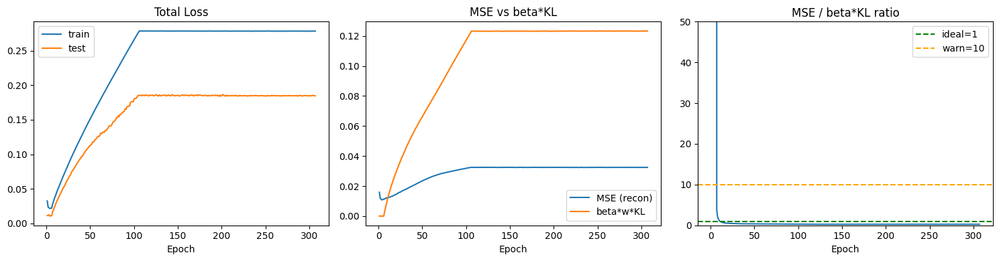

Final MSE/KL ratio  : 0.26  (target: 1-10)
KL per dim (zdims=4): 0.3082  (healthy: > 0.1)


In [32]:
# ── Cell 6: Plot training loss curves ─────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt

cfg = load_config()
loss_dir = Path(cfg["project_path"]) / "model" / "model_losses"
mn = cfg["model_name"]

train_loss = np.load(loss_dir / f"train_losses_{mn}.npy")
test_loss  = np.load(loss_dir / f"test_losses_{mn}.npy")
mse_loss   = np.load(loss_dir / f"mse_train_losses_{mn}.npy")
kl_loss    = np.load(loss_dir / f"kl_losses_{mn}.npy")
weights    = np.load(loss_dir / f"weight_values_{mn}.npy")

epochs     = np.arange(1, len(train_loss) + 1)
beta       = cfg["beta"]
kl_weighted = beta * weights * kl_loss
ratio       = mse_loss / (kl_weighted + 1e-9)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(epochs, train_loss, label="train")
axes[0].plot(epochs, test_loss,  label="test")
axes[0].set_title("Total Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()

axes[1].plot(epochs, mse_loss,    label="MSE (recon)")
axes[1].plot(epochs, kl_weighted, label="beta*w*KL")
axes[1].set_title("MSE vs beta*KL"); axes[1].set_xlabel("Epoch"); axes[1].legend()

axes[2].plot(epochs, ratio)
axes[2].axhline(1,  color="green",  linestyle="--", label="ideal=1")
axes[2].axhline(10, color="orange", linestyle="--", label="warn=10")
axes[2].set_title("MSE / beta*KL ratio"); axes[2].set_xlabel("Epoch"); axes[2].legend()
axes[2].set_ylim(0, max(50, float(ratio[-10:].mean()) * 2))

plt.tight_layout()
plt.savefig(loss_dir / f"loss_summary_{mn}.png", dpi=120)
plt.show()

print(f"Final MSE/KL ratio  : {ratio[-1]:.2f}  (target: 1-10)")
print(f"KL per dim (zdims={cfg['zdims']}): {float(kl_loss[-1])/cfg['zdims']:.4f}  (healthy: > 0.1)")

In [33]:
# ── Cell 7: Evaluate model ─────────────────────────────────────────────────────
cfg = load_config()
vame.evaluate_model(config=cfg)
print("Evaluation complete. Reconstruction plots saved to model/evaluate/")

2026-04-06 05:02:46.3 INFO  --- [MainThread] vame.model.evaluate : 314 : Using CUDA
2026-04-06 05:02:46.4 INFO  --- [MainThread] vame.model.evaluate : 315 : GPU active: True
2026-04-06 05:02:46.7 INFO  --- [MainThread] vame.model.evaluate : 316 : GPU used: NVIDIA GeForce RTX 5060 Ti
2026-04-06 05:02:46.8 INFO  --- [MainThread] vame.model.evaluate : 321 : Evaluation of model: VAME_5pt
2026-04-06 05:02:46.164 INFO  --- [MainThread] vame.model.evaluate : 64 : Initialize test data. Datapoints 70966
2026-04-06 05:02:49.249 INFO  --- [MainThread] vame.model.evaluate : 343 : Evaluation finished successfully! You can find the results in: 'C:\Users\zuria\Kaplan\VAME\Open-Field-Test/model/evaluate/'
2026-04-06 05:02:49.249 INFO  --- [MainThread] vame.model.evaluate : 344 : Next steps:
            - vame.segment_session() to identify behavioral motifs.
            - re-run the model for further fine tuning. Check again with vame.evaluate_model()


Evaluation complete. Reconstruction plots saved to model/evaluate/


In [34]:
# ── Cell 8: Segment sessions ───────────────────────────────────────────────────
cfg = load_config()
vame.segment_session(
    config=cfg,
    overwrite_segmentation=True,
    overwrite_embeddings=True,
)
print("Segmentation complete.")

2026-04-06 05:02:49.296 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-04-06 05:02:49.297 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME_5pt model (OPTIMIZED)
2026-04-06 05:02:49.307 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 4 keypoints
2026-04-06 05:02:49.308 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['neck', 'mouse_center', 'tail_base', 'head_midpoint']
2026-04-06 05:02:49.309 INFO  --- [MainThread] vame.analysis.pose_segmentation : 197 : Embedding of latent vector for file Subject 1 - JS1 - CBD- OFT_DLC
2026-04-06 05:02:49.310 INFO  --- [MainThread] vame.util.auxiliary : 35 : Using CUDA
2026-04-06 05:02:49.311 INFO  --- [MainThread] vame.util.auxiliary : 36 : GPU active: True
2026-04-06 05:02:49.311 INFO  --- [MainThread] vame.util.auxiliary : 37 : GPU used: NVIDIA 

Segmentation complete.


In [35]:
# ── Cell 9: Community analysis ─────────────────────────────────────────────────
# Groups the 8 HMM motifs into higher-level behavioral communities.
# cut_tree=2 creates 2 community groups -- adjust based on your experimental needs.
# Must run AFTER segment_session.

cfg = load_config()
vame.community(
    config=cfg,
    cut_tree=2,
)
print("Community analysis complete. Results in results/community_cohort/")

2026-04-06 05:09:31.34 INFO  --- [MainThread] vame.analysis.community_analysis : 494 : ---------------------------------------------------------------------
2026-04-06 05:09:31.35 INFO  --- [MainThread] vame.analysis.community_analysis : 495 : Community analysis for model: VAME_5pt 

2026-04-06 05:09:31.36 INFO  --- [MainThread] vame.analysis.community_analysis : 497 : Community analysis for segmentation algorithm hmm with 8 clusters
2026-04-06 05:09:31.644 INFO  --- [MainThread] vame.analysis.community_analysis : 524 : Cohort motif labels from hmm saved
2026-04-06 05:09:31.645 INFO  --- [MainThread] vame.analysis.community_analysis : 532 : Cohort motif counts from hmm saved
2026-04-06 05:09:31.646 INFO  --- [MainThread] vame.analysis.community_analysis : 533 : [ 67667. 160230. 104027. 136106.  65416.  68754.  33177.  73364.]
2026-04-06 05:09:33.228 INFO  --- [MainThread] vame.analysis.community_analysis : 547 : Cohort transition matrix saved
2026-04-06 05:09:33.235 | WARNING  | vame.a

Community analysis complete. Results in results/community_cohort/


In [36]:
# ── Cell 10: Motif videos ──────────────────────────────────────────────────────
cfg = load_config()
vame.motif_videos(
    config=cfg,
    video_type=".mp4",
    output_video_type=".mp4",
)
print("Motif videos saved to results/<session>/VAME_5pt/hmm-8/cluster_videos/")

2026-04-06 05:09:33.924 INFO  --- [MainThread] vame.analysis.videowriter : 213 : Creating motif videos for session Subject 1 - JS1 - CBD- OFT_DLC, algorithm: hmm, n_clusters: 8
2026-04-06 05:09:33.925 INFO  --- [MainThread] vame.analysis.videowriter : 67 : Motif videos getting created for Subject 1 - JS1 - CBD- OFT_DLC ...
2026-04-06 05:09:34.36 INFO  --- [MainThread] vame.analysis.videowriter : 101 : Cluster: 0
2026-04-06 05:09:34.41 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 0/1000 [00:00<?, ?it/s]
2026-04-06 05:09:34.584 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 0%|          | 1/1000 [00:00<09:00,  1.85it/s]
2026-04-06 05:09:34.692 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 1%|1         | 10/1000 [00:00<00:49, 19.92it/s]
2026-04-06 05:09:34.793 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 2%|1         | 19/1000 [00:00<00:27, 35.73it/s]
2026-04-06 05:09:34.900 INFO  --- [MainThread] vame.analysis.videowriter : 83 : 3%|

Motif videos saved to results/<session>/VAME_5pt/hmm-8/cluster_videos/


2026-04-06 07:30:24.916 INFO  --- [MainThread] vame.visualization.umap : 677 : UMAP embedding already exists at C:\Users\zuria\Kaplan\Vame\Open-Field-Test\results\umap_embedding.nc. Loading...
2026-04-06 07:30:25.364 INFO  --- [MainThread] vame.visualization.umap : 780 : UMAP figure saved to C:\Users\zuria\Kaplan\Vame\Open-Field-Test\reports\umap\umap_VAME_5pt_hmm-8.png


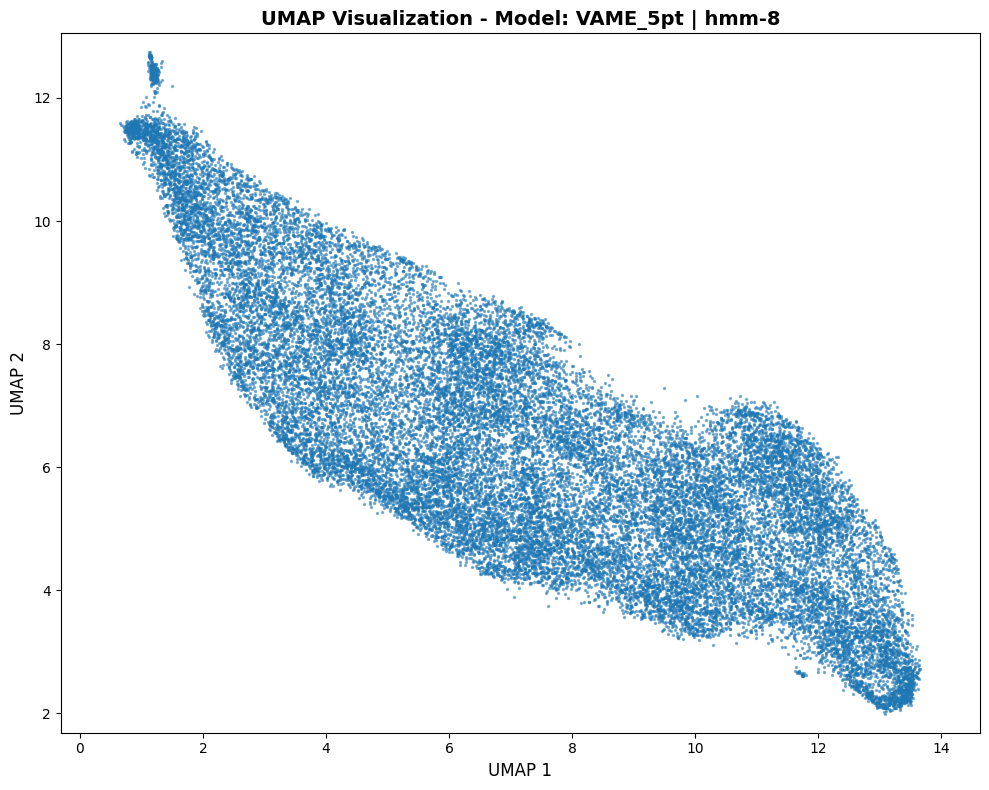

2026-04-06 07:30:26.133 INFO  --- [MainThread] vame.visualization.umap : 780 : UMAP figure saved to C:\Users\zuria\Kaplan\Vame\Open-Field-Test\reports\umap\umap_VAME_5pt_hmm-8_motif.png


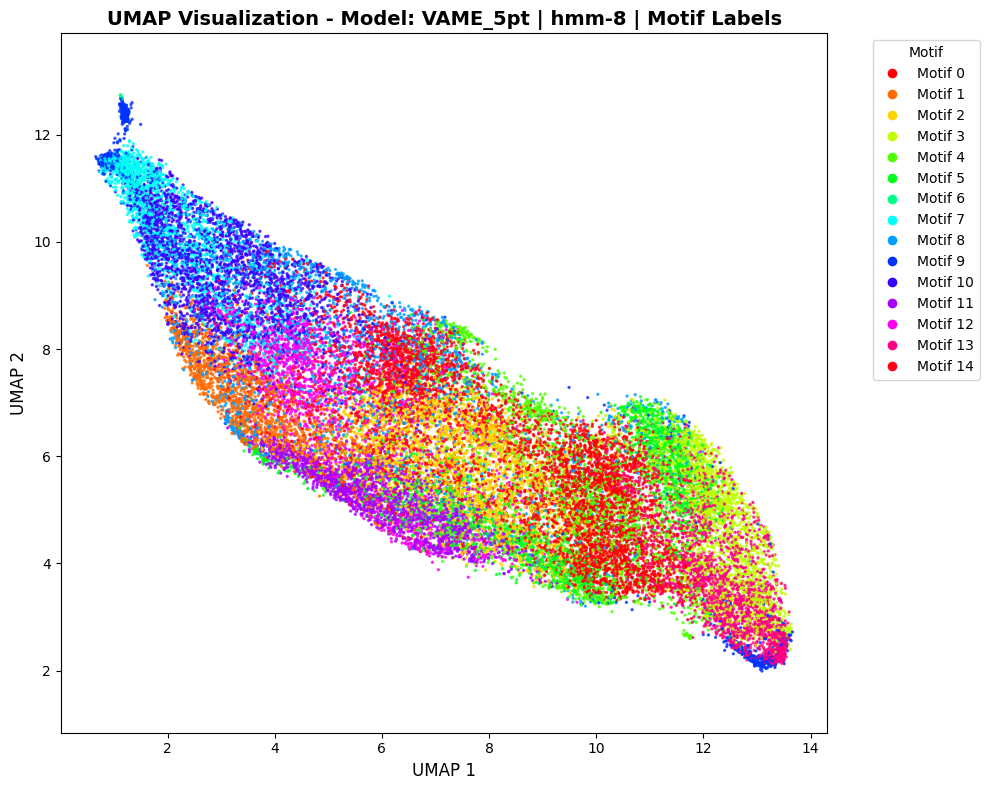

2026-04-06 07:30:27.332 INFO  --- [MainThread] vame.visualization.umap : 780 : UMAP figure saved to C:\Users\zuria\Kaplan\Vame\Open-Field-Test\reports\umap\umap_VAME_5pt_hmm-8_community.png


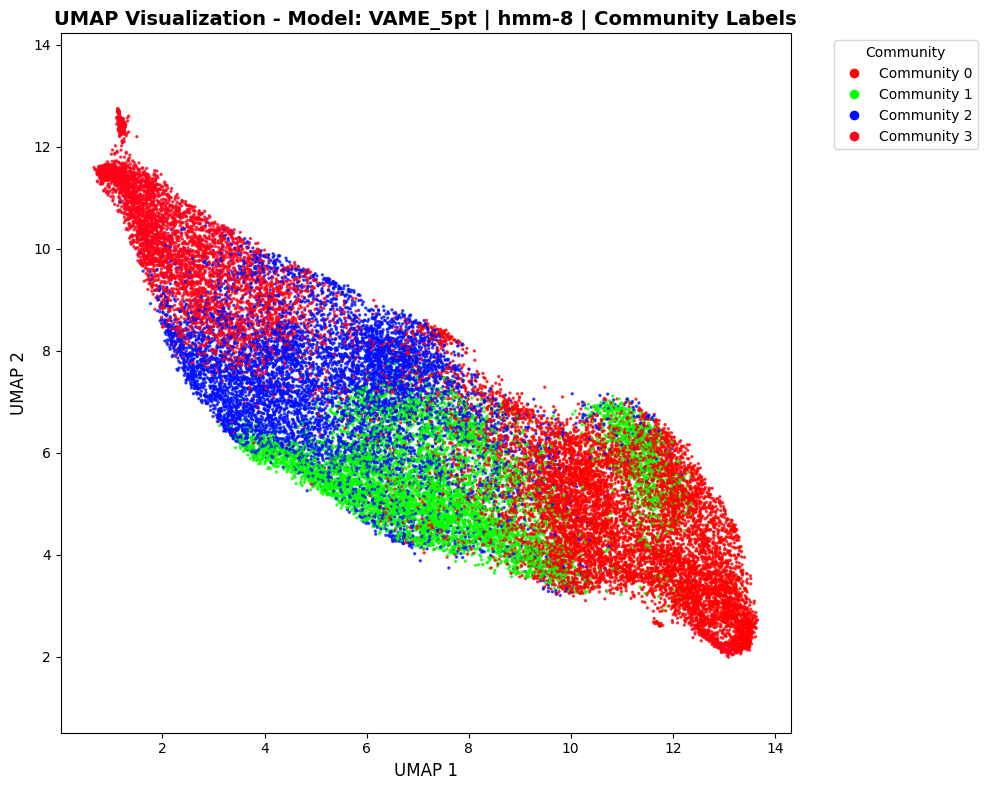

2026-04-06 07:30:31.651 INFO  --- [MainThread] vame.visualization.umap : 821 : Interactive UMAP figure saved to C:\Users\zuria\Kaplan\Vame\Open-Field-Test\reports\umap\umap_VAME_5pt_hmm-8_interactive.html


UMAP saved to results/


In [37]:
# ── Cell 11: UMAP visualization ────────────────────────────────────────────────
from vame.visualization.umap import visualize_umap

cfg = load_config()
visualize_umap(
    config=cfg,
    num_points=30_000,
    save_to_file=True,
    show_figure="matplotlib",
)
print("UMAP saved to results/")

In [38]:
# ── Cell 12: Segmentation quality metrics ─────────────────────────────────────
# Silhouette score, Davies-Bouldin index, motif usage entropy, bout length
# Run after segment_session() and community() have completed for VAME_5pt

import numpy as np
from pathlib import Path
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.stats import entropy

results_root = Path('Open-Field-Test/results')
MODEL        = 'VAME_5pt'
HMM_DIR      = 'hmm-8'
N_MOTIFS     = 8
np.random.seed(42)

all_silhouettes, all_db, all_entropies, all_bout_lens, all_usage = [], [], [], [], []

for sess_hmm in sorted(results_root.glob(f'*/{MODEL}/{HMM_DIR}')):
    latent_path  = sess_hmm.parent / 'latent_vectors.npy'
    label_files  = list(sess_hmm.glob('*hmm_label*.npy'))
    if not latent_path.exists() or not label_files:
        continue

    latent = np.load(latent_path)
    labels = np.load(label_files[0])
    n = min(len(latent), len(labels))
    latent, labels = latent[:n], labels[:n]

    # Silhouette + DB (subsample for speed)
    idx = np.random.choice(n, min(5000, n), replace=False)
    if len(np.unique(labels[idx])) > 1:
        all_silhouettes.append(silhouette_score(latent[idx], labels[idx]))
        all_db.append(davies_bouldin_score(latent[idx], labels[idx]))

    # Usage entropy (normalized 0–1)
    usage = np.bincount(labels, minlength=N_MOTIFS).astype(float)
    usage /= usage.sum()
    all_usage.append(usage)
    all_entropies.append(entropy(usage + 1e-9) / np.log(N_MOTIFS))

    # Median bout length
    bouts, prev, count = [], labels[0], 1
    for lab in labels[1:]:
        if lab == prev:
            count += 1
        else:
            bouts.append(count); prev, count = lab, 1
    bouts.append(count)
    all_bout_lens.append(np.median(bouts))

print(f"=== Segmentation Quality: {MODEL} (n={len(all_silhouettes)} sessions) ===\n")
print(f"Silhouette score   : {np.mean(all_silhouettes):.3f} ± {np.std(all_silhouettes):.3f}")
print(f"  Interpretation   : >0.4 good | 0.2–0.4 acceptable | <0.2 poor")
print(f"Davies-Bouldin idx : {np.mean(all_db):.3f} ± {np.std(all_db):.3f}  (lower is better)")
print(f"Usage entropy      : {np.mean(all_entropies):.3f} ± {np.std(all_entropies):.3f}  (1.0 = perfectly uniform)")
print(f"Median bout length : {np.mean(all_bout_lens):.1f} ± {np.std(all_bout_lens):.1f} frames")

print(f"\nPer-motif usage (mean across sessions):")
mean_usage = np.mean(all_usage, axis=0)
for i, u in enumerate(mean_usage):
    bar = '█' * int(u * 40)
    print(f"  Motif {i}: {u*100:5.1f}%  {bar}")


=== Segmentation Quality: VAME_5pt (n=38 sessions) ===

Silhouette score   : 0.020 ± 0.079
  Interpretation   : >0.4 good | 0.2–0.4 acceptable | <0.2 poor
Davies-Bouldin idx : 23.824 ± 13.310  (lower is better)
Usage entropy      : 0.878 ± 0.068  (1.0 = perfectly uniform)
Median bout length : 1.0 ± 0.0 frames

Per-motif usage (mean across sessions):
  Motif 0:   9.5%  ███
  Motif 1:  22.7%  █████████
  Motif 2:  14.7%  █████
  Motif 3:  19.2%  ███████
  Motif 4:   9.2%  ███
  Motif 5:   9.7%  ███
  Motif 6:   4.7%  █
  Motif 7:  10.4%  ████


Metric                        VAME (Run 1 — collapsed)      VAME_5pt (Run 3 — healthy)  
------------------------------------------------------------------------------------------
Silhouette (higher better)    -0.004 ± 0.045                 0.020 ± 0.080              
Davies-Bouldin (lower better)   3.479 ± 0.330                24.566 ± 12.171              
Usage entropy (higher = balanced)   0.808 ± 0.198                 0.878 ± 0.068              
Median bout length (frames)   989.961 ± 4080.317                 1.000 ± 0.000              

Per-motif usage (mean across sessions):
  Motif     VAME (Run 1 — collap  VAME_5pt (Run 3 — he
  Motif 0     13.9% ██                      9.5% █                   
  Motif 1      5.3% █                      22.7% ████                
  Motif 2     13.9% ██                     14.7% ██                  
  Motif 3     15.2% ███                    19.2% ███                 
  Motif 4     14.3% ██                      9.2% █                   
  Motif

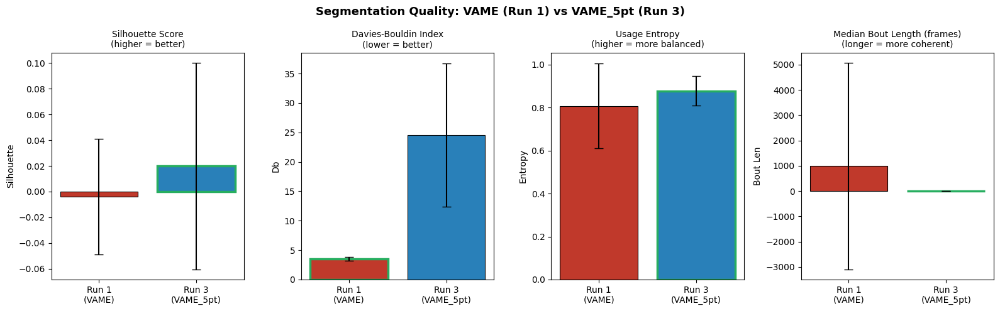


Saved: Open-Field-Test/model/segmentation_comparison.png


In [39]:
# ── Cell 13: Model comparison — VAME_5pt vs old VAME ─────────────────────────
# Compares Run 3 (VAME_5pt, 5 features, beta=0.1) vs Run 1 (VAME, 47 features,
# beta=2.44 + sum reduction — posterior collapse). Same 38 sessions, same HMM-8.

import numpy as np
from pathlib import Path
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.stats import entropy
import matplotlib.pyplot as plt

results_root = Path('Open-Field-Test/results')
HMM_DIR  = 'hmm-8'
N_MOTIFS = 8
np.random.seed(42)

MODELS = {
    'VAME (Run 1 — collapsed)': 'VAME',
    'VAME_5pt (Run 3 — healthy)': 'VAME_5pt',
}

results = {}

for label, model in MODELS.items():
    sils, dbs, ents, bouts_med, usages = [], [], [], [], []

    for sess_hmm in sorted(results_root.glob(f'*/{model}/{HMM_DIR}')):
        latent_path = sess_hmm.parent / 'latent_vectors.npy'
        label_files = list(sess_hmm.glob('*hmm_label*.npy'))
        if not latent_path.exists() or not label_files:
            continue

        latent = np.load(latent_path)
        labels = np.load(label_files[0])
        n = min(len(latent), len(labels))
        latent, labels = latent[:n], labels[:n]

        idx = np.random.choice(n, min(5000, n), replace=False)
        if len(np.unique(labels[idx])) > 1:
            sils.append(silhouette_score(latent[idx], labels[idx]))
            dbs.append(davies_bouldin_score(latent[idx], labels[idx]))

        usage = np.bincount(labels, minlength=N_MOTIFS).astype(float)
        usage /= usage.sum()
        usages.append(usage)
        ents.append(entropy(usage + 1e-9) / np.log(N_MOTIFS))

        bouts, prev, count = [], labels[0], 1
        for lab in labels[1:]:
            if lab == prev: count += 1
            else: bouts.append(count); prev, count = lab, 1
        bouts.append(count)
        bouts_med.append(np.median(bouts))

    results[label] = {
        'silhouette': np.array(sils),
        'db':         np.array(dbs),
        'entropy':    np.array(ents),
        'bout_len':   np.array(bouts_med),
        'usage':      np.array(usages),
        'n':          len(sils),
    }

# ── Text summary ──────────────────────────────────────────────────────────────
print(f"{'Metric':<28}", end='')
for label in MODELS:
    print(f"  {label[:28]:<28}", end='')
print()
print('-' * 90)

for metric, name in [('silhouette', 'Silhouette (higher better)'),
                      ('db',         'Davies-Bouldin (lower better)'),
                      ('entropy',    'Usage entropy (higher = balanced)'),
                      ('bout_len',   'Median bout length (frames)')]:
    print(f"{name:<28}", end='')
    for label in MODELS:
        arr = results[label][metric]
        print(f"  {np.mean(arr):6.3f} ± {np.std(arr):.3f}{'':14}", end='')
    print()

# ── Per-motif usage comparison ────────────────────────────────────────────────
print("\nPer-motif usage (mean across sessions):")
header = f"  {'Motif':<8}"
for label in MODELS:
    header += f"  {label[:20]:<20}"
print(header)
for i in range(N_MOTIFS):
    row = f"  Motif {i}  "
    for label in MODELS:
        u = np.mean(results[label]['usage'], axis=0)[i]
        bar = '█' * int(u * 20)
        row += f"  {u*100:5.1f}% {bar:<20}"
    print(row)

# ── Bar chart comparison ───────────────────────────────────────────────────────
metrics_plot = [
    ('silhouette', 'Silhouette Score\n(higher = better)', True),
    ('db',         'Davies-Bouldin Index\n(lower = better)', False),
    ('entropy',    'Usage Entropy\n(higher = more balanced)', True),
    ('bout_len',   'Median Bout Length (frames)\n(longer = more coherent)', True),
]

fig, axes = plt.subplots(1, 4, figsize=(16, 5))
colors = ['#c0392b', '#2980b9']

for ax, (metric, title, higher_better) in zip(axes, metrics_plot):
    means = [np.mean(results[lbl][metric]) for lbl in MODELS]
    stds  = [np.std(results[lbl][metric])  for lbl in MODELS]
    bars  = ax.bar(['Run 1\n(VAME)', 'Run 3\n(VAME_5pt)'], means, yerr=stds,
                   color=colors, capsize=5, edgecolor='black', linewidth=0.8)
    ax.set_title(title, fontsize=10)
    ax.set_ylabel(metric.replace('_', ' ').title())
    winner = 1 if higher_better else 0
    bars[winner].set_edgecolor('#27ae60')
    bars[winner].set_linewidth(2.5)

plt.suptitle('Segmentation Quality: VAME (Run 1) vs VAME_5pt (Run 3)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('Open-Field-Test/model/segmentation_comparison.png', dpi=150, bbox_inches='tight')
plt.show()
print("\nSaved: Open-Field-Test/model/segmentation_comparison.png")


---
## Segmentation Diagnostics & Improvement Attempts

Run these cells in order to diagnose the 1-frame bout problem and try fixes.


In [40]:
# ── Cell 14: Bout length audit ────────────────────────────────────────────────
# Inspect temporal coherence of HMM segmentation across all sessions.
# A healthy segmentation should have median bout >> 1 frame (at 30fps, aim >10).

import numpy as np
from pathlib import Path

results_root = Path('Open-Field-Test/results')
MODEL   = 'VAME_5pt'
HMM_DIR = 'hmm-8'

all_medians, all_means, all_maxes = [], [], []

print(f"{'Session':<45} {'Median':>7} {'Mean':>7} {'Max':>6} {'Transitions':>12}")
print('-' * 82)

for sess_hmm in sorted(results_root.glob(f'*/{MODEL}/{HMM_DIR}')):
    label_files = list(sess_hmm.glob('*hmm_label*.npy'))
    if not label_files:
        continue
    labels = np.load(label_files[0])
    bouts, prev, count = [], labels[0], 1
    for lab in labels[1:]:
        if lab == prev: count += 1
        else: bouts.append(count); prev, count = lab, 1
    bouts.append(count)
    bouts = np.array(bouts)
    all_medians.append(np.median(bouts))
    all_means.append(np.mean(bouts))
    all_maxes.append(np.max(bouts))
    name = sess_hmm.parents[1].name[:44]
    print(f"{name:<45} {np.median(bouts):>7.0f} {np.mean(bouts):>7.1f} {np.max(bouts):>6} {len(bouts):>12,}")

print('-' * 82)
print(f"{'MEAN ACROSS SESSIONS':<45} {np.mean(all_medians):>7.1f} {np.mean(all_means):>7.1f} {np.mean(all_maxes):>6.0f}")
print(f"\nVerdict: median bout = {np.mean(all_medians):.1f} frames → ", end='')
if np.mean(all_medians) < 3:
    print("CRITICAL — HMM switching every frame. Try cells below.")
elif np.mean(all_medians) < 10:
    print("POOR — very choppy. Consider fewer clusters or smoothing.")
else:
    print("OK — temporal coherence looks reasonable.")


Session                                        Median    Mean    Max  Transitions
----------------------------------------------------------------------------------
Female 1- CBD- EB4- 4-16-21_DLC                     1     3.0    172        6,236
Female 2- CBD- EB5- 4-16-21_DLC                     1     2.9    168        6,419
Female 3- CBD- DN1-02-19-21_DLC                     1     1.7    198       11,083
Female 4- CBD - DN2-02-19-21_DLC                    1     2.8    204        6,634
Female 5-CBD-DN3-02-19-21_DLC                       1     2.6    186        7,163
Female 6-CBD-DN4-02-19-21_DLC                       1     3.7    199        5,070
Female7-CBD-DN5-02-19-21_DLC                        1     2.1    143        8,832
Female8- CBD- DN6-02-19-21_DLC                      1     3.2    203        5,802
Male 1-CBD-DN1-2-19-21_DLC                          1     2.2    158        8,610
Male 2-CBD-DN-2-19-21_DLC                           1     3.4    273        5,628
Subject 1 - JS1

In [42]:
# ── Cell 15: Re-segment — HMM with fewer clusters ─────────────────────────────
# Try n_clusters = 4 and 5. A 4D latent space may only cleanly support 4-5 clusters.
# This overwrites the existing hmm-4 / hmm-5 results if they exist.
#
# NOTE: segment_session() reads n_clusters and segmentation_algorithms from the
# config dict — they are not accepted as direct keyword arguments.

import vame, yaml

with open('Open-Field-Test/config.yaml') as f:
    cfg = yaml.safe_load(f)

orig_n   = cfg['n_clusters']
orig_alg = cfg['segmentation_algorithms']

for n in [4, 5]:
    print(f"\n>>> Segmenting with n_clusters={n} ...")
    cfg['n_clusters'] = n
    cfg['segmentation_algorithms'] = ['hmm']
    vame.segment_session(
        config=cfg,
        overwrite_segmentation=True,
        overwrite_embeddings=False,  # reuse existing latent vectors
    )
    print(f"    Done: hmm-{n}")

# Restore original config values (does not write to disk)
cfg['n_clusters'] = orig_n
cfg['segmentation_algorithms'] = orig_alg

print("\nFinished. Run Cell 16 to check bout lengths.")


2026-04-09 15:32:01.90 INFO  --- [MainThread] vame.analysis.pose_segmentation : 172 : ---------------------------------------------------------------------
2026-04-09 15:32:01.93 INFO  --- [MainThread] vame.analysis.pose_segmentation : 173 : Embedding latent vectors for VAME_5pt model (OPTIMIZED)
2026-04-09 15:32:01.114 INFO  --- [MainThread] vame.util.model_util : 56 : Loaded training metadata with 4 keypoints
2026-04-09 15:32:01.115 INFO  --- [MainThread] vame.util.model_util : 57 : Keypoints used during training: ['neck', 'mouse_center', 'tail_base', 'head_midpoint']
2026-04-09 15:32:01.119 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1 - JS1 - CBD- OFT_DLC already exists, skipping...
2026-04-09 15:32:01.121 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 2 - JS2 - CBD- OFT_DLC already exists, skipping...
2026-04-09 15:32:01.127 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent v


>>> Segmenting with n_clusters=4 ...


2026-04-09 15:32:01.245 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 8-P28 vehicle-FV8-10-23-21_DLC already exists, skipping...
2026-04-09 15:32:01.250 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 9-P28 vehicle-FV9-10-23-21_DLC already exists, skipping...
2026-04-09 15:32:01.256 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 3- CBD- DN1-02-19-21_DLC already exists, skipping...
2026-04-09 15:32:01.260 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 4- CBD - DN2-02-19-21_DLC already exists, skipping...
2026-04-09 15:32:01.266 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 5-CBD-DN3-02-19-21_DLC already exists, skipping...
2026-04-09 15:32:01.271 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Female 6-CBD-DN4-02-19-21_DLC already exists, skipping...

    Done: hmm-4

>>> Segmenting with n_clusters=5 ...


2026-04-09 15:34:20.51 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 7-P14 vehicle-EZ7-8-3-2021_DLC already exists, skipping...
2026-04-09 15:34:20.57 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 1-P28 vehicle-FV1-10-23-21_DLC already exists, skipping...
2026-04-09 15:34:20.64 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 2-P28 vehicle-FV2-10-23-21_DLC already exists, skipping...
2026-04-09 15:34:20.75 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 3-P28 vehicle-FV3-10-23-21_DLC already exists, skipping...
2026-04-09 15:34:20.81 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 4-P28 vehicle-FV4-10-23-21_DLC already exists, skipping...
2026-04-09 15:34:20.90 INFO  --- [MainThread] vame.analysis.pose_segmentation : 190 : Latent vector for Subject 5-P28 vehicle-FV5-10-23-21_DLC al

    Done: hmm-5

Finished. Run Cell 16 to check bout lengths.


In [43]:
# ── Cell 16: Compare bout lengths across cluster counts ───────────────────────
# Check whether fewer clusters gives more temporally coherent segmentation.

import numpy as np
from pathlib import Path

results_root = Path('Open-Field-Test/results')
MODEL = 'VAME_5pt'

def median_bout(labels):
    bouts, prev, count = [], labels[0], 1
    for lab in labels[1:]:
        if lab == prev: count += 1
        else: bouts.append(count); prev, count = lab, 1
    bouts.append(count)
    return np.median(bouts), np.mean(bouts)

# Collect all hmm-N variants across all sessions (no trailing slash in glob)
variants = set()
for sess_model_dir in results_root.glob(f'*/{MODEL}'):
    if sess_model_dir.is_dir():
        for d in sess_model_dir.iterdir():
            if d.is_dir() and d.name.startswith('hmm-'):
                variants.add(d.name)
variants = sorted(variants, key=lambda x: int(x.split('-')[1]))

if not variants:
    print("No hmm-N result directories found. Run Cell 15 first.")
else:
    print(f"{'Variant':<12} {'Median (mean±std)':<24} {'Mean bout':<16} Verdict")
    print('-' * 68)

    for variant in variants:
        medians, means = [], []
        for sess_hmm in results_root.glob(f'*/{MODEL}/{variant}'):
            label_files = list(sess_hmm.glob('*hmm_label*.npy'))
            if label_files:
                labels = np.load(label_files[0])
                med, mn = median_bout(labels)
                medians.append(med); means.append(mn)
        if medians:
            m, s = np.mean(medians), np.std(medians)
            verdict = 'CRITICAL' if m < 3 else ('POOR' if m < 10 else 'OK')
            print(f"{variant:<12} {m:5.1f} +/- {s:4.1f} frames        {np.mean(means):5.1f} frames    {verdict}")


Variant      Median (mean±std)        Mean bout        Verdict
--------------------------------------------------------------------
hmm-4         23.8 ±  3.9 frames          35.8 frames     OK
hmm-5          1.4 ±  2.3 frames           6.2 frames     CRITICAL
hmm-8          1.0 ±  0.0 frames           2.6 frames     CRITICAL


In [ ]:
# ── Cell 16b: Finalize with hmm-4 — update config, community, motif videos ────
# hmm-4 gave median bout 23.8 frames (~0.8s at 30fps) — the only viable option.
# This cell permanently sets n_clusters=4 in config.yaml and re-runs downstream
# steps that depend on the cluster count.

import vame, yaml
from pathlib import Path

CONFIG_PATH = 'Open-Field-Test/config.yaml'

# ── 1. Update config.yaml on disk ────────────────────────────────────────────
with open(CONFIG_PATH) as f:
    cfg = yaml.safe_load(f)

cfg['n_clusters'] = 4
cfg['segmentation_algorithms'] = ['hmm']

with open(CONFIG_PATH, 'w') as f:
    yaml.dump(cfg, f, default_flow_style=False, sort_keys=False)

print(f"config.yaml updated: n_clusters=4, segmentation_algorithms=['hmm']")

# ── 2. Community analysis (hmm-4) ─────────────────────────────────────────────
print("\nRunning community analysis ...")
vame.community(config=cfg, cut_tree=2)
print("Community analysis complete.")

# ── 3. Motif videos (hmm-4) ───────────────────────────────────────────────────
print("\nGenerating motif videos ...")
vame.motif_videos(config=cfg, video_type='.mp4', output_video_type='.mp4')
print("\nDone. Check results/<session>/VAME_5pt/hmm-4/cluster_videos/")


2026-04-09 16:06:19.711 INFO  --- [MainThread] vame.analysis.community_analysis : 494 : ---------------------------------------------------------------------
2026-04-09 16:06:19.712 INFO  --- [MainThread] vame.analysis.community_analysis : 495 : Community analysis for model: VAME_5pt 

2026-04-09 16:06:19.713 INFO  --- [MainThread] vame.analysis.community_analysis : 497 : Community analysis for segmentation algorithm hmm with 4 clusters


config.yaml updated: n_clusters=4, segmentation_algorithms=['hmm']

Running community analysis ...


2026-04-09 16:06:19.963 INFO  --- [MainThread] vame.analysis.community_analysis : 524 : Cohort motif labels from hmm saved
2026-04-09 16:06:19.964 INFO  --- [MainThread] vame.analysis.community_analysis : 532 : Cohort motif counts from hmm saved
2026-04-09 16:06:19.965 INFO  --- [MainThread] vame.analysis.community_analysis : 533 : [213119. 206473. 181674. 107475.]


In [45]:
# ── Cell 17: Re-segment — kmeans (bypasses HMM temporal model) ────────────────
# K-means assigns each frame to its nearest cluster — no temporal model.
# Run for n=4,5,8 to compare against HMM results.
# If kmeans also gives 1-frame bouts → clusters genuinely overlap in latent space.
# If kmeans gives longer bouts → the HMM transition prior is too loose.

import vame, yaml

with open('Open-Field-Test/config.yaml') as f:
    cfg = yaml.safe_load(f)

orig_n   = cfg['n_clusters']
orig_alg = cfg['segmentation_algorithms']

for n in [4, 5, 8]:
    print(f"\n>>> K-means with n_clusters={n} ...")
    cfg['n_clusters'] = n
    cfg['segmentation_algorithms'] = ['kmeans']
    vame.segment_session(
        config=cfg,
        overwrite_segmentation=True,
        overwrite_embeddings=False,  # reuse existing latent vectors
    )
    print(f"    Done: kmeans-{n}")

# Restore
cfg['n_clusters'] = orig_n
cfg['segmentation_algorithms'] = orig_alg

print("\nFinished. Run Cell 18 to compare kmeans vs hmm bout lengths.")



>>> K-means with n_clusters=4 ...


TypeError: segment_session() got an unexpected keyword argument 'segmentation_algorithms'

In [ ]:
# ── Cell 18: Kmeans bout length audit ─────────────────────────────────────────
# Compare kmeans vs hmm bout structure side by side.

import numpy as np
from pathlib import Path

results_root = Path('Open-Field-Test/results')
MODEL = 'VAME_5pt'

def median_bout_stats(labels):
    bouts, prev, count = [], labels[0], 1
    for lab in labels[1:]:
        if lab == prev: count += 1
        else: bouts.append(count); prev, count = lab, 1
    bouts.append(count)
    b = np.array(bouts)
    return np.median(b), np.mean(b), np.max(b)

print(f"{'Variant':<14} {'Median':>8} {'Mean':>8} {'Max':>8}  Verdict")
print('-' * 55)

sess_dirs = sorted(results_root.glob(f'*/{MODEL}/'))
all_variants = set()
for sd in sess_dirs:
    for d in sd.iterdir():
        if d.is_dir():
            all_variants.add(d.name)

for variant in sorted(all_variants, key=lambda x: (x.split('-')[0], int(x.split('-')[1]))):
    medians, means, maxes = [], [], []
    for sess_hmm in results_root.glob(f'*/{MODEL}/{variant}'):
        label_files = list(sess_hmm.glob('*hmm_label*.npy')) or list(sess_hmm.glob('*_label*.npy'))
        if label_files:
            labels = np.load(label_files[0])
            med, mn, mx = median_bout_stats(labels)
            medians.append(med); means.append(mn); maxes.append(mx)
    if medians:
        m = np.mean(medians)
        verdict = 'CRITICAL' if m < 3 else ('POOR' if m < 10 else 'OK ✓' if m < 60 else 'GOOD ✓✓')
        print(f"{variant:<14} {m:>8.1f} {np.mean(means):>8.1f} {np.mean(maxes):>8.0f}  {verdict}")


In [ ]:
# ── Cell 19: Inspect HMM transition matrix (hmm-4) ───────────────────────────
# High diagonal values (>0.9) = stable states with long bouts.
# Low diagonal values (<0.7) = rapid switching.

import numpy as np, pickle
from pathlib import Path

results_root = Path('Open-Field-Test/results')
MODEL   = 'VAME_5pt'
HMM_DIR = 'hmm-4'

hmm_files = list(results_root.glob(f'*/{MODEL}/{HMM_DIR}/*.pkl'))
hmm_files += list(results_root.glob(f'*/{MODEL}/*.pkl'))
hmm_files += list(Path('Open-Field-Test/model').glob('**/*hmm*.pkl'))

if not hmm_files:
    print("No HMM .pkl found. VAME may not persist the HMM object to disk.")
else:
    for hf in hmm_files[:2]:
        print(f"Loading: {hf}")
        with open(hf, 'rb') as f:
            obj = pickle.load(f)
        if hasattr(obj, 'transmat_'):
            T = obj.transmat_
            print("  Self-transition probabilities (diagonal):")
            for i, v in enumerate(np.diag(T)):
                bar = '#' * int(v * 30)
                print(f"    State {i}: {v:.4f}  {bar}")
            print(f"  Mean: {np.mean(np.diag(T)):.4f}  Min: {np.min(np.diag(T)):.4f}")
        else:
            print(f"  Attributes: {[a for a in dir(obj) if not a.startswith('_')][:15]}")
